<a href="https://colab.research.google.com/github/andirayulia/Soft-Computing-Projects/blob/main/EAS_Subcluster5_GA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Clustering has finished


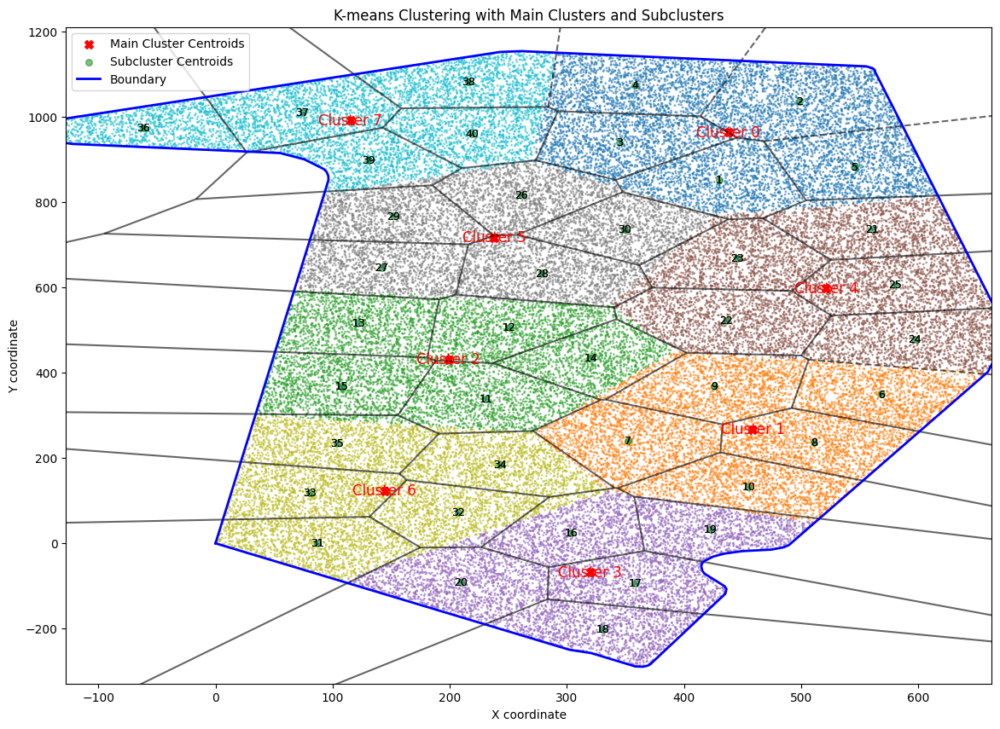

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import pandas as pd

# Tentukan koordinat dari sudut-sudut batas non-square boundary
data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan titik-titik, label, dan centroid subcluster ke dalam dataset
    subclusters_points.extend(main_cluster_points)
    subclusters_label.extend(cluster_labels_sub)
    main_labels.extend(main_cluster_labels)
    subclusters_centroid.extend(centroids_sub)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)

    # Tambahkan penomoran untuk setiap subcluster
    subcluster_number.extend(range(counter, counter + n_subclusters))
    counter += n_subclusters

subclusters_label = np.array(subclusters_label)
subclusters_points = np.array(subclusters_points)
main_labels = np.array(main_labels)
subclusters_centroid = np.array(subclusters_centroid)
subclusters_centroid_sub_labels = np.array(subclusters_centroid_sub_labels)
subclusters_centroid_main_labels = np.array(subclusters_centroid_main_labels)
subcluster_number = np.array(subcluster_number)

# Simpan hasil klustering ke dalam DataFrame
df_clusters = pd.DataFrame({
    'MainCluster': subclusters_centroid_main_labels,
    'SubCluster': subcluster_number,
    'x': subclusters_centroid[:, 0],
    'y': subclusters_centroid[:, 1]
})

# Simpan DataFrame ke file CSV
df_clusters.to_csv('subclusters5.csv', index=False)

print('Clustering has finished')

# Visualisasi hasil clustering menggunakan Voronoi untuk subclusters
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot centroids of main clusters
ax.scatter(kmeans_main.cluster_centers_[:, 0], kmeans_main.cluster_centers_[:, 1], c='red', s=50, marker='X', label='Main Cluster Centroids')
# Plot centroids of subclusters
ax.scatter(subclusters_centroid[:, 0], subclusters_centroid[:, 1], c='green', s=30, marker='o', label='Subcluster Centroids',alpha=0.5)

# Annotate main cluster centroids with cluster labels
for i, (x, y) in enumerate(kmeans_main.cluster_centers_):
    ax.text(x, y, f'Cluster {i}', fontsize=12, ha='center', va='center', color='red')

# Annotate subcluster centroids with numbers
for i, (x, y) in enumerate(subclusters_centroid):
    ax.text(x, y, str(subcluster_number[i]), fontsize=9, ha='center', va='center', color='black')

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='blue', linewidth=2, label='Boundary')

# Annotate subclusters with numbers
for i, (x, y) in enumerate(subclusters_centroid):
    ax.text(x, y, str(subcluster_number[i]), fontsize=9, ha='center', va='center', color='black')

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters and Subclusters')
ax.legend()
plt.show()


In [ ]:
import pandas as pd

# Baca DataFrame dari file CSV
df_clusters = pd.read_csv('subclusters5.csv')

# Ubah indeks DataFrame agar dimulai dari 1
df_clusters.index = df_clusters.index + 1

# Buat dataframe baru dengan data dari cluster 0
df_clusters0 = df_clusters[df_clusters['MainCluster'] == 0]

df_clusters1 = df_clusters[df_clusters['MainCluster'] == 1]

df_clusters2 = df_clusters[df_clusters['MainCluster'] == 2]

df_clusters3 = df_clusters[df_clusters['MainCluster'] == 3]

df_clusters4 = df_clusters[df_clusters['MainCluster'] == 4]

df_clusters5 = df_clusters[df_clusters['MainCluster'] == 5]

df_clusters6 = df_clusters[df_clusters['MainCluster'] == 6]

df_clusters7 = df_clusters[df_clusters['MainCluster'] == 7]


,MainCluster,SubCluster,x,y
36,7,36,-61.941788,974.514663
37,7,37,74.270670,1011.297194
38,7,38,216.082072,1082.556143
39,7,39,130.833077,898.090100
40,7,40,219.225558,961.135606


Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 61.78146505355835 seconds

Optimal route for Combined Clusters 5_4: [21 28 22 24 25 23 30 26 29 27]
Distance: 1415.8246392777774
Total Rotation: 442.6108631061852
Runtime: 59.3764214515686 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 56.96337270736694 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 57.18009853363037 seconds



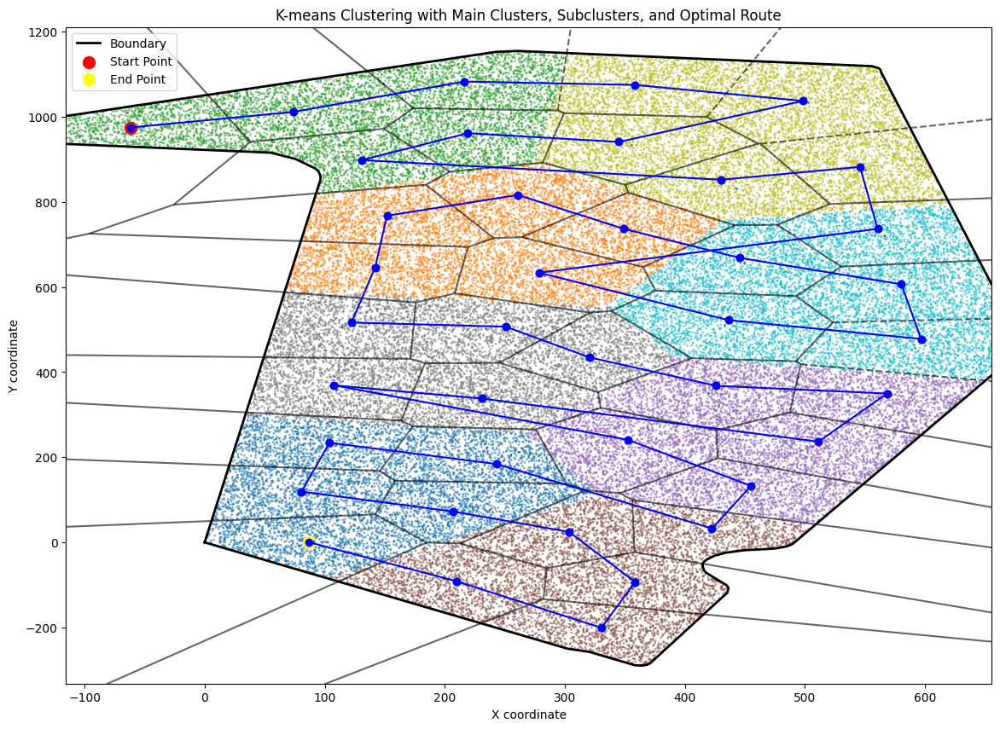

Total Cost: 634.1463315396776
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 28 22 24 25 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  6000.126353411181
Total Rotation:  2133.3560124099617


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.8)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.8
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)


Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 57.0285279750824 seconds

Optimal route for Combined Clusters 5_4: [21 28 22 24 25 23 30 26 29 27]
Distance: 1415.8246392777774
Total Rotation: 442.6108631061852
Runtime: 57.436269998550415 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 57.07814931869507 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 60.292378187179565 seconds



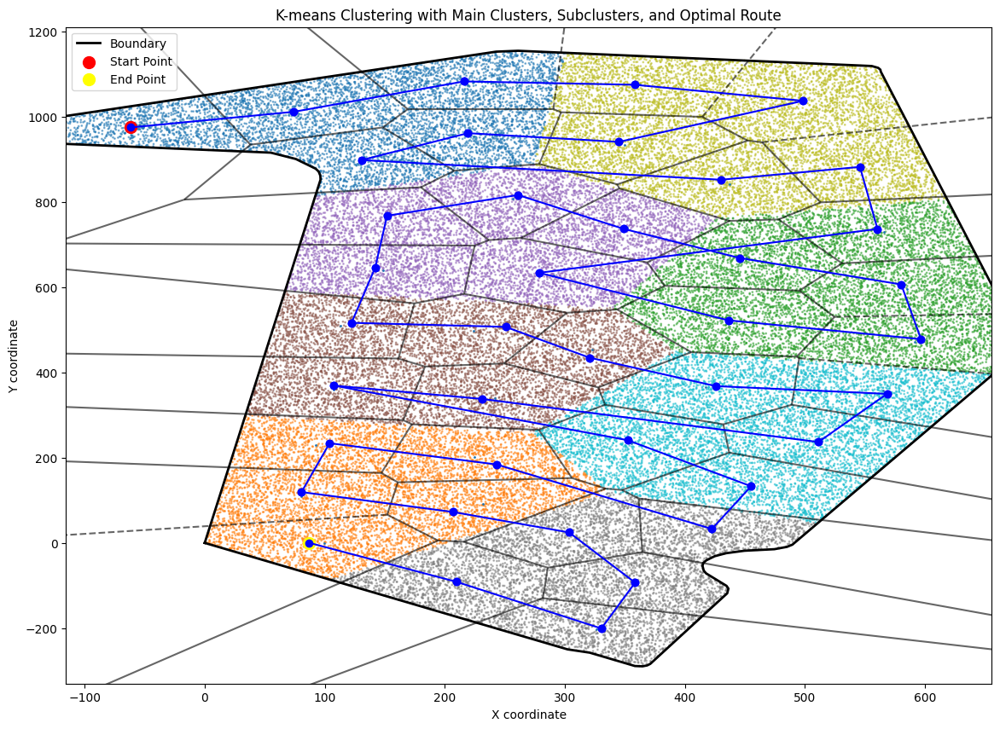

Total Cost: 634.1463315396776
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 28 22 24 25 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  6000.126353411181
Total Rotation:  2133.3560124099617


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.8)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.8
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)


Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 57.368425369262695 seconds

Optimal route for Combined Clusters 5_4: [21 25 24 22 28 23 30 26 29 27]
Distance: 1269.8494202793513
Total Rotation: 525.9739058157911
Runtime: 62.568395376205444 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 59.11429762840271 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 57.146641969680786 seconds



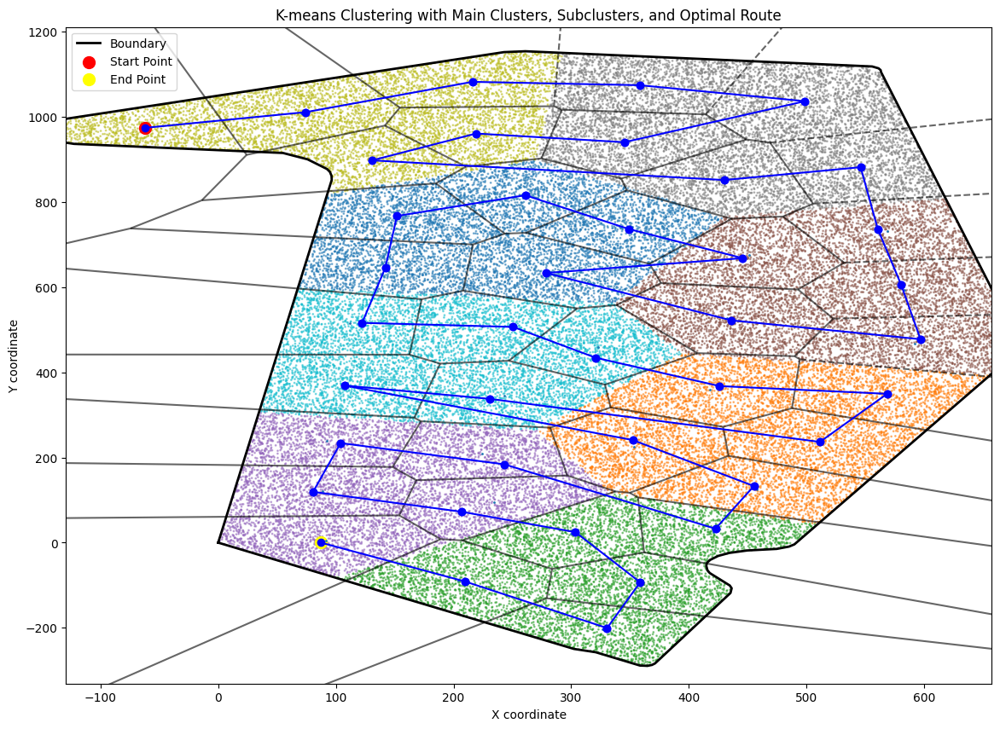

Total Cost: 611.1076588778665
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 25 24 22 28 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  5854.151134412756
Total Rotation:  2141.0454530492407


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.6)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.6
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)


Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 72.7410409450531 seconds

Optimal route for Combined Clusters 5_4: [21 25 24 22 28 23 30 26 29 27]
Distance: 1269.8494202793513
Total Rotation: 525.9739058157911
Runtime: 58.33458852767944 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 58.66669321060181 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 61.126296281814575 seconds



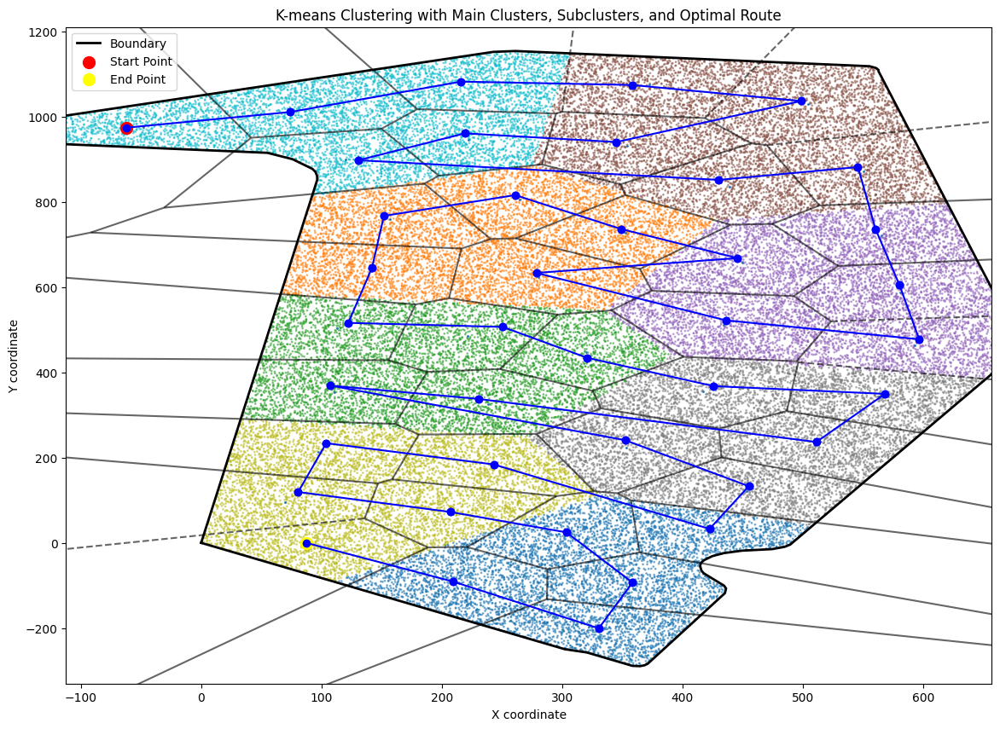

Total Cost: 611.1076588778665
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 25 24 22 28 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  5854.151134412756
Total Rotation:  2141.0454530492407


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.6)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.6
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)


Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 74.90771269798279 seconds

Optimal route for Combined Clusters 5_4: [21 28 22 24 25 23 30 26 29 27]
Distance: 1415.8246392777774
Total Rotation: 442.6108631061852
Runtime: 56.16248440742493 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 57.36306118965149 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 56.99631142616272 seconds



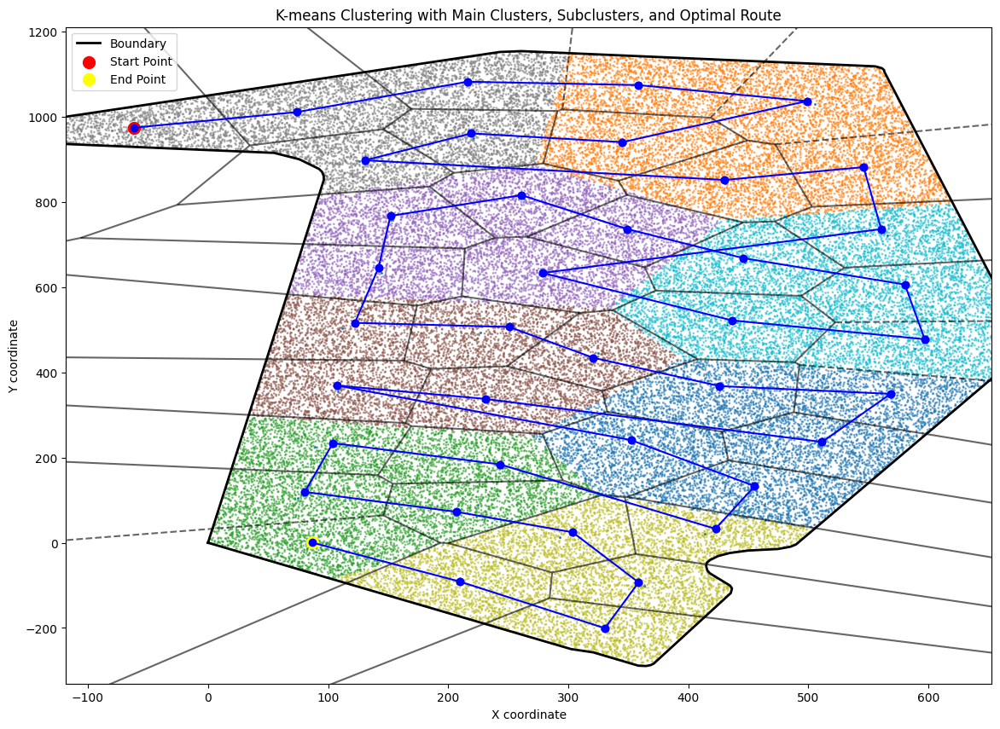

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.8)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.8
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)


Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 55.99353814125061 seconds

Optimal route for Combined Clusters 5_4: [21 28 22 24 25 23 30 26 29 27]
Distance: 1415.8246392777774
Total Rotation: 442.6108631061852
Runtime: 56.60423946380615 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 55.07628154754639 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 57.673378705978394 seconds



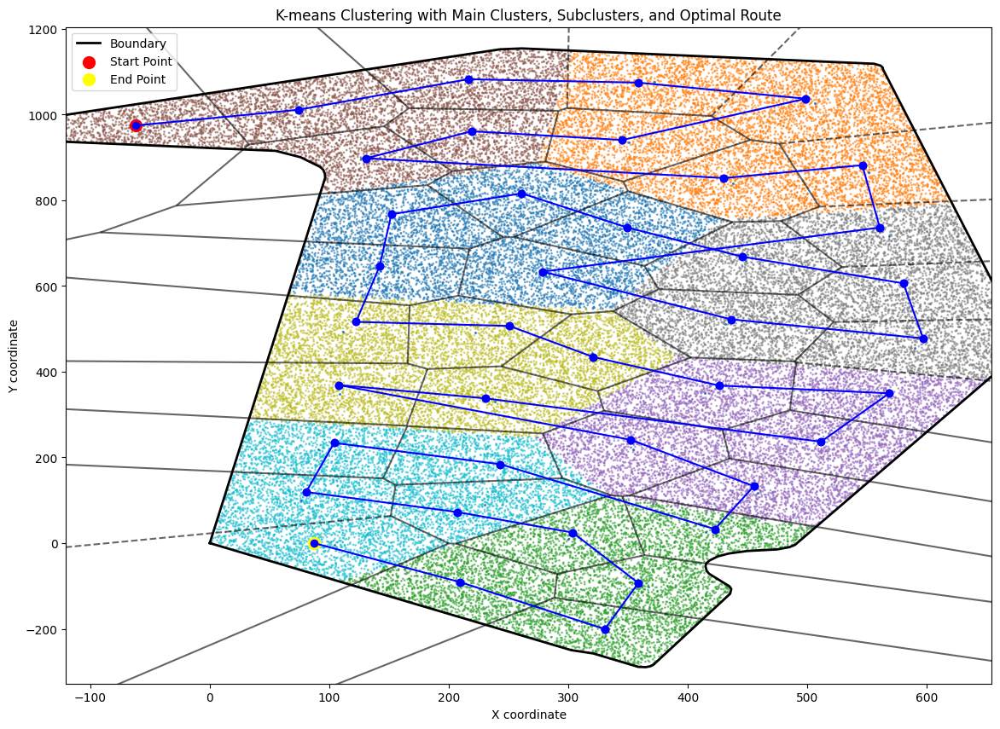

Total Cost: 634.1463315396776
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 28 22 24 25 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  6000.126353411181
Total Rotation:  2133.3560124099617


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.8)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.8
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)


Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 65.34261083602905 seconds

Optimal route for Combined Clusters 5_4: [21 28 22 24 25 23 30 26 29 27]
Distance: 1415.8246392777774
Total Rotation: 442.6108631061852
Runtime: 61.143012046813965 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 63.172136545181274 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 57.26921820640564 seconds



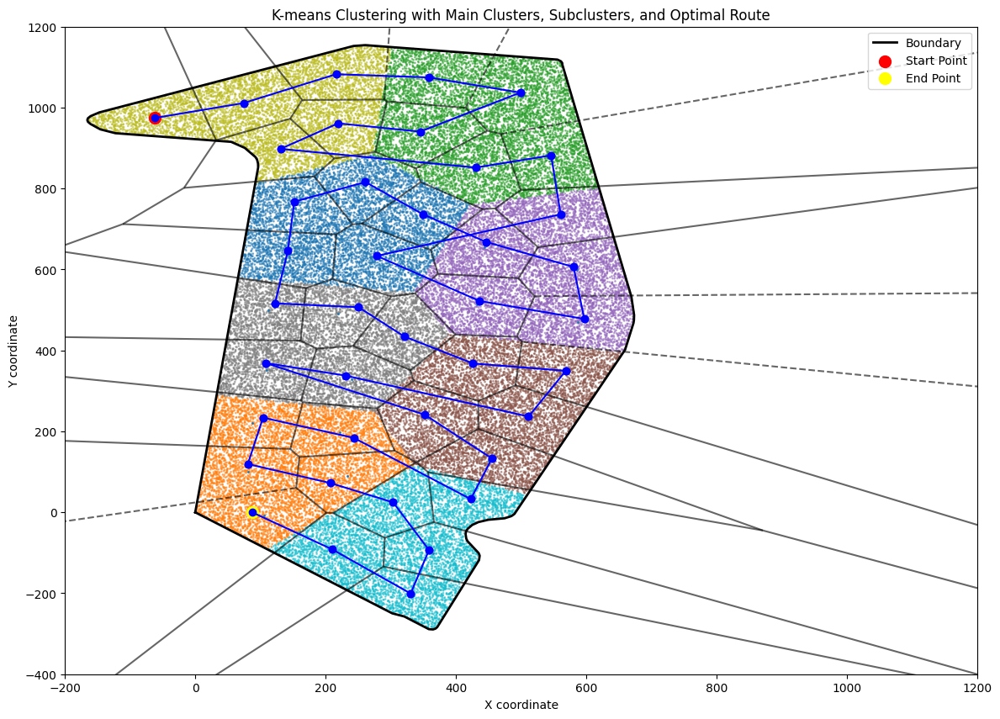

Total Cost: 634.1463315396776
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 28 22 24 25 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  6000.126353411181
Total Rotation:  2133.3560124099617


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.8)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlim([-200, 1200])
ax.set_ylim([-400, 1200])

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.8
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)



Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 66.42560744285583 seconds

Optimal route for Combined Clusters 5_4: [21 25 24 22 28 23 30 26 29 27]
Distance: 1269.8494202793513
Total Rotation: 525.9739058157911
Runtime: 58.84674263000488 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 57.07810592651367 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 59.131465911865234 seconds



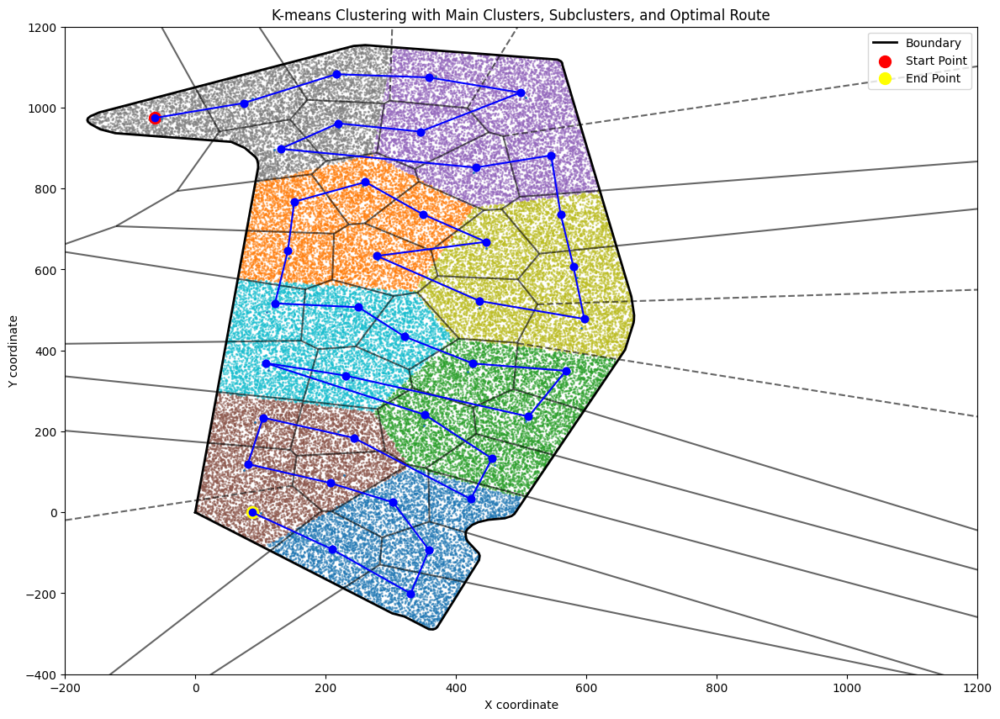

Total Cost: 611.1076588778665
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 25 24 22 28 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  5854.151134412756
Total Rotation:  2141.0454530492407


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=500, generations=1000, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.6)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlim([-200, 1200])
ax.set_ylim([-400, 1200])

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.6
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)



Optimal route for Combined Clusters 7_0: [36 37 38  4  2  3 40 39  1  5]
Distance: 1427.4662665118324
Total Rotation: 407.902954974498
Runtime: 12.082885503768921 seconds

Optimal route for Combined Clusters 5_4: [21 25 24 22 28 23 30 26 29 27]
Distance: 1269.8494202793513
Total Rotation: 525.9739058157911
Runtime: 11.953768014907837 seconds

Optimal route for Combined Clusters 2_1: [13 12 14  9  6  8 11 15  7 10]
Distance: 1474.9939358904608
Total Rotation: 444.593791026522
Runtime: 12.039733648300171 seconds

Optimal route for Combined Clusters 6_3: [19 34 35 33 32 16 17 18 20 31]
Distance: 1299.1540867463505
Total Rotation: 395.6286107523726
Runtime: 12.388118267059326 seconds



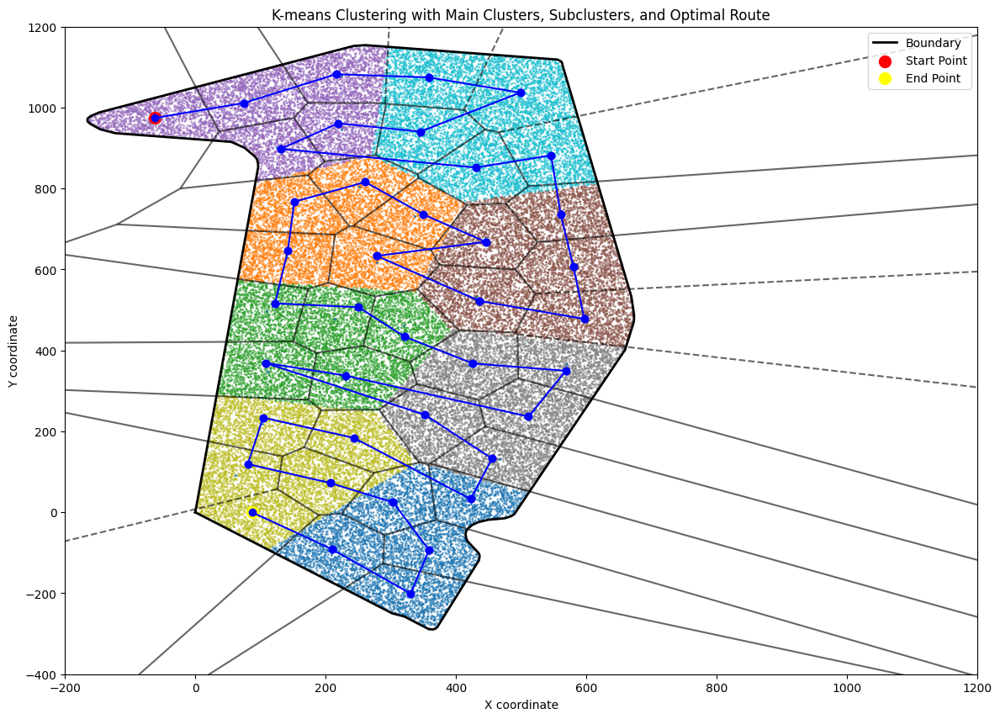

Total Cost: 611.1076588778665
Final Optimal Route:  [36 37 38  4  2  3 40 39  1  5 21 25 24 22 28 23 30 26 29 27 13 12 14  9
  6  8 11 15  7 10 19 34 35 33 32 16 17 18 20 31]
Final Distance:  5854.151134412756
Total Rotation:  2141.0454530492407


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import random
import time

# Function to calculate the total distance of a given tour
def calculate_total_distance(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i], tour[i+1]]
    return total_distance

# Function to calculate the total rotation angle of a given tour
def calculate_total_rotation(tour, coordinates):
    total_rotation = 0
    for i in range(len(tour) - 2):
        forward_vector = coordinates[tour[i+1]] - coordinates[tour[i]]
        backward_vector = coordinates[tour[i+2]] - coordinates[tour[i+1]]
        dot_product = np.dot(forward_vector, backward_vector)
        length_forward = np.linalg.norm(forward_vector)
        length_backward = np.linalg.norm(backward_vector)
        cosin_angle = dot_product / (length_forward * length_backward)
        angle_rad = np.arccos(cosin_angle)
        angle_deg = np.degrees(angle_rad)

        # Aturan untuk menetapkan sudut menjadi 0 jika kurang dari 15 derajat
        if angle_deg < 15:
            angle_deg = 0

        total_rotation += angle_deg
    return total_rotation

# Genetic Algorithm to solve TSP for a given cluster
def genetic_algorithm_tsp(distance_matrix, coordinates, population_size=200, generations=500, mutation_rate=0.01, start_point=None, end_point=None):
    num_points = len(distance_matrix)

    # Initialize population
    population = [random.sample(range(num_points), num_points) for _ in range(population_size)]

    def mutate(tour):
        i, j = random.sample(range(num_points), 2)
        tour[i], tour[j] = tour[j], tour[i]
        return tour

    def crossover(parent1, parent2):
        child = [-1] * num_points
        start, end = sorted(random.sample(range(num_points), 2))
        child[start:end] = parent1[start:end]
        pointer = end
        for i in range(num_points):
            if pointer >= num_points:
                pointer = 0
            if parent2[i] not in child:
                while child[pointer] != -1:
                    pointer += 1
                    if pointer >= num_points:
                        pointer = 0
                child[pointer] = parent2[i]
        return child

    def apply_constraints(tour):
        if start_point is not None and end_point is not None:
            if tour[0] != start_point:
                tour[tour.index(start_point)], tour[0] = tour[0], tour[tour.index(start_point)]
            if tour[-1] != end_point:
                tour[tour.index(end_point)], tour[-1] = tour[-1], tour[tour.index(end_point)]
        return tour

    def calculate_fitness(tour):
        distance = calculate_total_distance(tour, distance_matrix)
        rotation = calculate_total_rotation(tour, coordinates)
        return (distance * 0.4) + (rotation * 0.6)

    for _ in range(generations):
        population = sorted(population, key=lambda tour: calculate_fitness(tour))
        next_population = population[:population_size // 2]
        for _ in range(population_size // 2, population_size):
            parent1, parent2 = random.sample(population[:population_size // 2], 2)
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                child = mutate(child)
            child = apply_constraints(child)
            next_population.append(child)
        population = next_population

    best_tour = min(population, key=lambda tour: calculate_fitness(apply_constraints(tour)))
    best_distance = calculate_total_distance(best_tour, distance_matrix)
    best_rotation = calculate_total_rotation(best_tour, coordinates)

    return best_tour, best_distance, best_rotation

# Load the clusters data
df_clusters = pd.read_csv('subclusters5.csv')

# Create a distance matrix for all subclusters
all_points = df_clusters[['x', 'y']].values
distance_matrix = np.linalg.norm(all_points[:, None] - all_points[None, :], axis=-1)

# Define combined clusters with start and end points
combined_clusters = {
    '7_0': {'indices': df_clusters[(df_clusters['MainCluster'] == 7) | (df_clusters['MainCluster'] == 0)]['SubCluster'].values - 1, 'start': 36 - 1, 'end': 5 - 1},
    '5_4': {'indices': df_clusters[(df_clusters['MainCluster'] == 5) | (df_clusters['MainCluster'] == 4)]['SubCluster'].values - 1, 'start': 21 - 1, 'end': 27 - 1},
    '2_1': {'indices': df_clusters[(df_clusters['MainCluster'] == 2) | (df_clusters['MainCluster'] == 1)]['SubCluster'].values - 1, 'start': 13 - 1, 'end': 10 - 1},
    '6_3': {'indices': df_clusters[(df_clusters['MainCluster'] == 6) | (df_clusters['MainCluster'] == 3)]['SubCluster'].values - 1, 'start': 19 - 1, 'end': 31 - 1},
}

# Optimize combined clusters
optimal_routes = {}

for key, cluster_data in combined_clusters.items():
    subcluster_indices = cluster_data['indices']
    subcluster_distance_matrix = distance_matrix[np.ix_(subcluster_indices, subcluster_indices)]
    subcluster_coordinates = all_points[subcluster_indices]

    start_time = time.time()
    best_tour, best_distance, best_rotation = genetic_algorithm_tsp(subcluster_distance_matrix, subcluster_coordinates, start_point=subcluster_indices.tolist().index(cluster_data['start']), end_point=subcluster_indices.tolist().index(cluster_data['end']))
    end_time = time.time()

    optimal_route = subcluster_indices[best_tour]
    optimal_routes[key] = optimal_route

    print(f"Optimal route for Combined Clusters {key}: {optimal_route + 1}")
    print(f"Distance: {best_distance}")
    print(f"Total Rotation: {best_rotation}")
    print(f"Runtime: {end_time - start_time} seconds\n")

# Order of main clusters: combined clusters 2_4 > combined clusters 1_6 > clusters 5 > clusters 3 > combined clusters 7_0
final_order = ['7_0', '5_4', '2_1', '6_3']
final_route = []

for key in final_order:
    final_route.extend(optimal_routes[key])

# Define the boundary data
boundary_data = [
    (0, 0),
    (302.318326963504, -249.678344962675),
    (320.803749317576, -257.435363635839),
    (358.444032305935, -288.740871041425),
    (364.81708472517, -289.451098790319),
    (368.664123370539, -287.309318238906),
    (371.261543895038, -283.680498345541),
    (435.358027683743, -118.230725243817),
    (436.357722181201, -107.133416698109),
    (434.77784784182, -100.708075050178),
    (417.756263857984, -71.4444724155634),
    (415.810429926043, -65.0080334597462),
    (414.775032054537, -54.1326710843839),
    (415.399841114972, -47.1746586263602),
    (418.041890856714, -40.6383438932563),
    (424.977271431482, -31.1279504699403),
    (434.402962404797, -24.1477433961435),
    (449.737561924569, -18.3549483355926),
    (474.64959176085, -14.7372257501142),
    (485.101754762477, -9.29954456085606),
    (489.680712592965, -4.06161492932535),
    (659.432408553471, 401.644888181158),
    (672.383807799377, 467.851430962036),
    (673.053246078325, 475.09797344088),
    (673.285318015348, 487.182942448415),
    (669.125874839127, 532.770685952382),
    (563.318923324132, 1105.49168266805),
    (562.98866710689, 1110.04157917277),
    (561.194572518143, 1114.29184834563),
    (555.749807845733, 1118.63089598789),
    (261.098780642115, 1154.39752142879),
    (242.854356068261, 1152.3334220389),
    (-147.196088867237, 988.137644800891),
    (-160.567002767409, 978.960170636248),
    (-164.699668411509, 973.677851766864),
    (-165.574401096626, 969.338804124605),
    (-164.628261662143, 964.933172635028),
    (-160.638409516774, 959.506588753656),
    (-145.741176340196, 946.389570055902),
    (-122.516130967978, 936.790398163186),
    (55.0546040956078, 915.428079213722),
    (75.9589301001302, 900.513296527961),
    (92.4360376160908, 877.797105934337),
    (94.9174221714433, 871.1165261924),
    (96.3187796355089, 861.69491123533),
    (96.4972965108251, 852.184517812015)
]

# Buat objek Polygon yang mewakili batas non-square boundary
boundary = Polygon(boundary_data)

# Hasilkan data sintetis untuk cluster utama
n_samples = 60000
n_main_clusters = 8  # Jumlah cluster utama
n_subclusters = 5  # Jumlah subcluster dalam setiap cluster utama
random_state = 42

points = []

while len(points) < n_samples:
    x = np.random.uniform(boundary.bounds[0], boundary.bounds[2])
    y = np.random.uniform(boundary.bounds[1], boundary.bounds[3])
    point = (x, y)
    if boundary.contains(Point(point)):
        points.append(point)

points = np.array(points)

# Lakukan K-means clustering pada cluster utama
kmeans_main = KMeans(n_clusters=n_main_clusters, random_state=random_state, n_init=10)
kmeans_main.fit(points)
cluster_labels_main = kmeans_main.labels_

# Hasilkan data sintetis untuk subcluster dalam setiap cluster utama
subclusters_centroid = []
subclusters_label = []
subclusters_points = []
subclusters_centroid_sub_labels = []
subclusters_centroid_main_labels = []
main_labels = []
subcluster_number = []

counter = 1

for i in range(n_main_clusters):
    # Pilih titik-titik yang termasuk dalam cluster utama i
    main_cluster_points = points[cluster_labels_main == i]
    main_cluster_labels = np.repeat(i, len(main_cluster_points))

    # Lakukan K-means clustering pada titik-titik dari cluster utama i
    kmeans_sub = KMeans(n_clusters=n_subclusters, random_state=random_state, n_init=10)
    kmeans_sub.fit(main_cluster_points)
    cluster_labels_sub = kmeans_sub.labels_
    centroids_sub = kmeans_sub.cluster_centers_
    centroid_sub_labels = kmeans_sub.predict(centroids_sub)
    centroid_main_labels = np.repeat(i, len(centroids_sub))

    # Tambahkan centroid subcluster ke dalam subclusters_centroid
    for centroid in centroids_sub:
        subclusters_centroid.append(centroid)

    subclusters_label.extend(cluster_labels_sub)
    subclusters_points.extend(main_cluster_points)
    subclusters_centroid_sub_labels.extend(centroid_sub_labels)
    subclusters_centroid_main_labels.extend(centroid_main_labels)
    main_labels.extend(main_cluster_labels)
    subcluster_number.extend([counter] * n_subclusters)
    counter += 1

subclusters_centroid = np.array(subclusters_centroid)

# Visualisasi
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all points
ax.scatter(points[:, 0], points[:, 1], c=cluster_labels_main, cmap='tab10', s=1, alpha=0.5)

# Plot Voronoi diagram for subclusters
vor = Voronoi(subclusters_centroid)
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

# Plot boundary
x, y = boundary.exterior.xy
ax.plot(x, y, color='black', linewidth=2, label='Boundary')

# Plot the optimal route
for i in range(len(final_route) - 1):
    ax.plot([all_points[final_route[i]][0], all_points[final_route[i+1]][0]], [all_points[final_route[i]][1], all_points[final_route[i+1]][1]], 'bo-')

# Highlight start and end points
ax.scatter(all_points[final_route[0]][0], all_points[final_route[0]][1], c='red', s=100, marker='o', label='Start Point')
ax.scatter(all_points[final_route[-1]][0], all_points[final_route[-1]][1], c='yellow', s=100, marker='o', label='End Point')

ax.set_xlim([-200, 1200])
ax.set_ylim([-400, 1200])

ax.set_xlabel('X coordinate')
ax.set_ylabel('Y coordinate')
ax.set_title('K-means Clustering with Main Clusters, Subclusters, and Optimal Route')
ax.legend()
plt.show()

# Calculate total cost, distance, and rotation
total_distance = calculate_total_distance(final_route, distance_matrix)
total_rotation = calculate_total_rotation(final_route, all_points)
distance_weight = 0.4
rotation_weight = 0.6
total_cost = (total_distance / 4 * distance_weight) + (total_rotation / 50 * rotation_weight)

print(f"Total Cost: {total_cost}")

# Convert final route indices to SubCluster numbers
final_route_subcluster = df_clusters.iloc[final_route]['SubCluster'].values

# Print final route
print("Final Optimal Route: ", final_route_subcluster)
print("Final Distance: ", total_distance)
print("Total Rotation: ", total_rotation)

